In [2]:
import fastai
from fastai.vision import *
from fastai.callbacks import *
from fastai.vision.gan import *

In [3]:
path = Path('data')
path_valid = path/'valid'
path_test = path/'test'
path_gen = path/'gen'

In [4]:
from PIL import Image

In [5]:
def grey(fn,i):
    dest = path_gen/fn.relative_to(path_test)
    dest.parent.mkdir(parents=True, exist_ok=True)
    img = Image.open(fn).convert('L')
    
    img.save(dest)

In [5]:
il = ImageItemList.from_folder(path_test)
parallel(grey, il.items)

In [6]:
arch = models.resnet34
src = ImageImageList.from_folder(path_gen).random_split_by_pct(0.1, seed=42)

In [7]:
def get_data(bs,size):
    data = (src.label_from_func(lambda x: path_test/x.name)
           .transform(get_transforms(max_zoom=2.), size=size, tfm_y=True)
           .databunch(bs=bs).normalize(imagenet_stats, do_y=True))

    return data

In [8]:
bs,size=32, 128

In [9]:
data = get_data(bs,size)

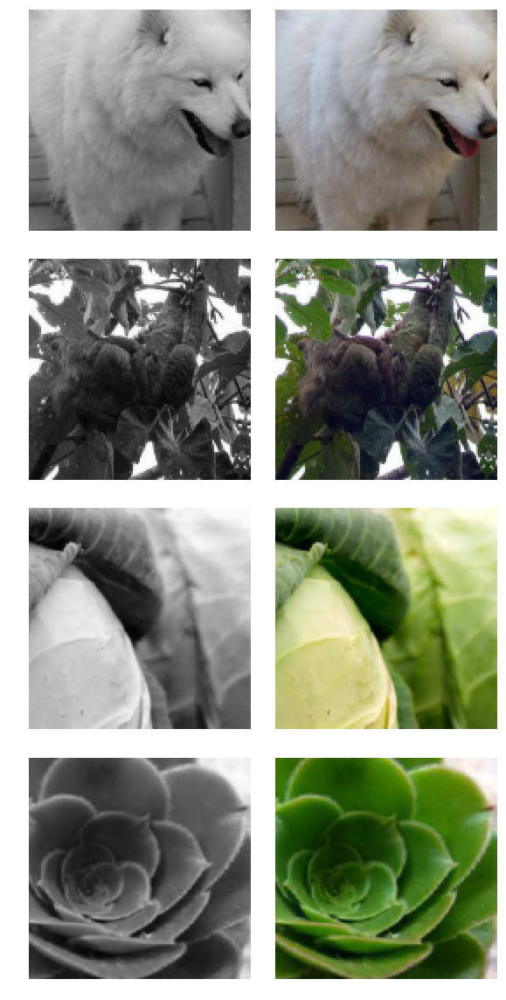

In [9]:
data.show_batch(4)

In [14]:
def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)

In [15]:
base_loss = F.l1_loss

In [16]:
from torchvision.models import vgg16_bn

In [17]:
vgg_m = vgg16_bn(True).features.cuda().eval()
requires_grad(vgg_m, False)

In [18]:
blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)]
blocks, [vgg_m[i] for i in blocks]

([5, 12, 22, 32, 42],
 [ReLU(inplace), ReLU(inplace), ReLU(inplace), ReLU(inplace), ReLU(inplace)])

In [19]:
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        self.feat_losses = [base_loss(input,target)]
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)
    
    def __del__(self): self.hooks.remove()

In [20]:
feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])

In [21]:
data.c = 3

In [22]:
wd = 1e-3
learn = unet_learner(data, arch, wd=wd, loss_func=feat_loss, callback_fns=LossMetrics,
                     blur=True, norm_type=NormType.Weight)
gc.collect();

In [23]:
gc.collect();

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


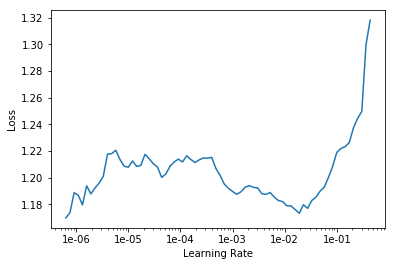

In [32]:
learn.lr_find()
learn.recorder.plot()

In [33]:
lr = 1e-4

In [25]:
def do_fit(save_name, lrs=slice(lr), pct_start=0.9):
    learn.fit_one_cycle(10, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=10, imgsize=5)

In [30]:
learn.load('2unfreeze')

Learner(data=ImageDataBunch;

Train: LabelList
y: ImageItemList (112893 items)
[Image (3, 279, 512), Image (3, 340, 512), Image (3, 384, 512), Image (3, 512, 512), Image (3, 512, 340)]...
Path: data/gen
x: ImageImageList (112893 items)
[Image (3, 279, 512), Image (3, 340, 512), Image (3, 384, 512), Image (3, 512, 512), Image (3, 512, 340)]...
Path: data/gen;

Valid: LabelList
y: ImageItemList (12543 items)
[Image (3, 392, 512), Image (3, 333, 512), Image (3, 512, 512), Image (3, 287, 512), Image (3, 384, 512)]...
Path: data/gen
x: ImageImageList (12543 items)
[Image (3, 392, 512), Image (3, 333, 512), Image (3, 512, 512), Image (3, 287, 512), Image (3, 384, 512)]...
Path: data/gen;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
      (3): MaxPool2d(kernel_

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2
1,1.202975,1.201385,0.212798,0.114879,0.147589,0.073679,0.207391,0.311530,0.133519
2,1.178610,1.202334,0.212903,0.114601,0.147323,0.073626,0.208680,0.311673,0.133528
3,1.169096,1.201140,0.212253,0.114087,0.146909,0.073552,0.209187,0.311664,0.133489
4,1.203002,1.201922,0.212628,0.114356,0.146881,0.073542,0.208959,0.311928,0.133628
5,1.193488,1.201742,0.212507,0.114166,0.146688,0.073500,0.209521,0.311708,0.133653
6,1.185108,1.202546,0.212844,0.114550,0.147269,0.073603,0.208519,0.312252,0.133509
7,1.206353,1.202509,0.213282,0.114848,0.147314,0.073442,0.208226,0.312205,0.133192
8,1.172931,1.202422,0.213304,0.113991,0.147011,0.073574,0.209176,0.311864,0.133502
9,1.190538,1.200497,0.212397,0.114753,0.147153,0.073534,0.207530,0.311676,0.133456
10,1.163152,1.194923,0.211599,0.114537,0.146761,0.073234,0.206077,0.309959,0.132755


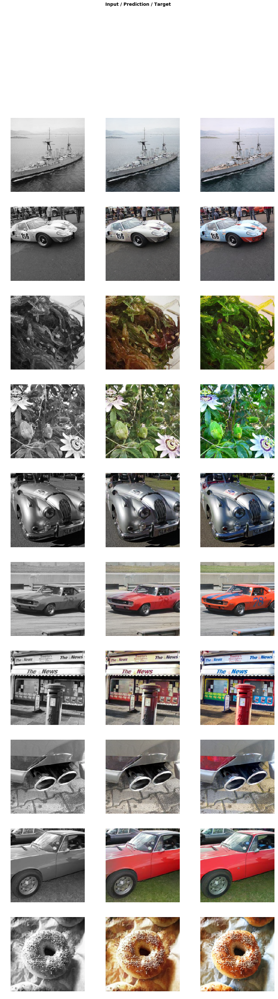

In [34]:
do_fit('3unfreeze', slice(lr*10))

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2
1,2.126131,2.184068,0.235366,0.133385,0.199830,0.116713,0.412199,0.748552,0.338024
2,2.122067,2.146648,0.231853,0.135339,0.199425,0.114841,0.394956,0.738355,0.331880
3,2.120535,2.142941,0.231815,0.135565,0.199620,0.114508,0.393161,0.737452,0.330820
4,2.105801,2.123742,0.229936,0.134806,0.197588,0.113947,0.387904,0.729688,0.329873
5,2.073102,2.120389,0.230134,0.132881,0.195799,0.113371,0.390809,0.728881,0.328514
6,2.077811,2.110786,0.227375,0.134145,0.196519,0.113469,0.384109,0.727300,0.327868
7,2.070497,2.103174,0.230485,0.134949,0.196445,0.112222,0.382054,0.723499,0.323520
8,2.063966,2.093318,0.228410,0.135171,0.196280,0.111834,0.376415,0.722659,0.322550
9,2.062874,2.089020,0.228455,0.133524,0.194983,0.111068,0.381135,0.719321,0.320534
10,2.019095,2.040227,0.221326,0.132412,0.191995,0.109290,0.367747,0.702212,0.315246


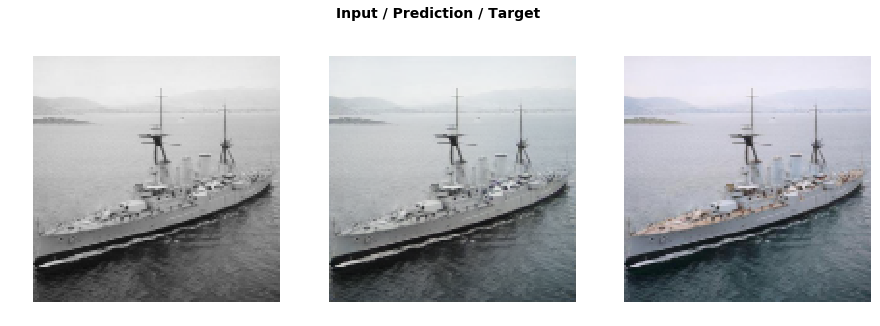

In [24]:
do_fit('1a', slice(lr*10))

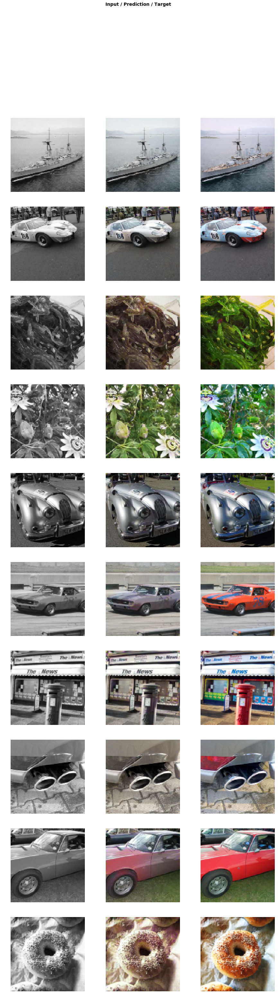

In [26]:
learn.show_results(rows=10, imgsize=5)

In [27]:
learn.unfreeze()

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2
1,2.010073,2.037895,0.220791,0.132317,0.191831,0.109244,0.367223,0.701304,0.315183
2,2.008264,2.036959,0.220603,0.132215,0.191706,0.109113,0.367440,0.700937,0.314946
3,2.017846,2.039878,0.221285,0.132173,0.191823,0.109331,0.367726,0.701976,0.315565
4,2.021871,2.041771,0.221741,0.131905,0.191534,0.109442,0.368829,0.702341,0.315980
5,2.016272,2.040351,0.221282,0.132360,0.191892,0.109527,0.366890,0.701904,0.316496
6,2.018328,2.045412,0.221860,0.131889,0.191722,0.109846,0.369068,0.703638,0.317390
7,2.021830,2.047849,0.222687,0.132185,0.192121,0.109780,0.369687,0.704476,0.316914
8,2.018122,2.045388,0.222529,0.132627,0.192028,0.109710,0.368376,0.703359,0.316759
9,1.996100,2.040278,0.221345,0.131516,0.191119,0.109424,0.369045,0.701507,0.316322
10,1.987130,2.027639,0.219456,0.131754,0.190849,0.108798,0.364794,0.697562,0.314426


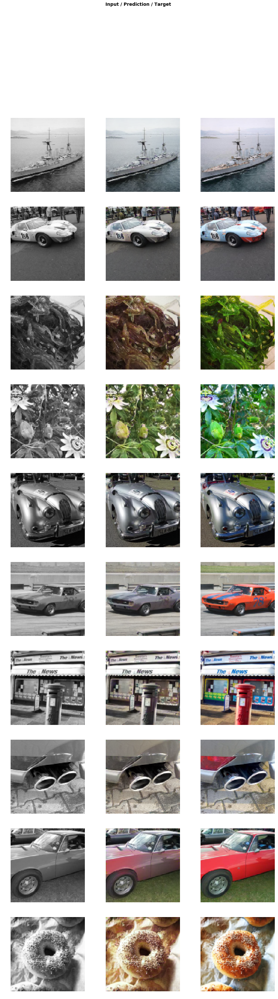

In [28]:
do_fit('1unfreeze', slice(1e-5,lr))

In [20]:
data = get_data(12,size*2)

In [30]:
learn.data = data
learn.freeze()
gc.collect()

84

In [31]:
learn.load('1unfreeze');

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2
1,1.231670,1.230330,0.219701,0.115370,0.149401,0.075058,0.216229,0.318658,0.135913
2,1.222749,1.226130,0.218439,0.114973,0.148913,0.074812,0.215658,0.317708,0.135627
3,1.234522,1.223968,0.218361,0.114975,0.148780,0.074628,0.214705,0.317184,0.135335
4,1.226269,1.221251,0.217235,0.114826,0.148687,0.074634,0.214210,0.316382,0.135278
5,1.209471,1.218474,0.216863,0.115071,0.148535,0.074430,0.212533,0.316069,0.134972
6,1.214320,1.217328,0.216532,0.114478,0.147853,0.074206,0.213901,0.315537,0.134821
7,1.225422,1.218782,0.216885,0.114679,0.148351,0.074431,0.213377,0.316001,0.135057
8,1.207185,1.214454,0.216290,0.115301,0.148242,0.074111,0.211153,0.314978,0.134380
9,1.238258,1.218160,0.218253,0.115933,0.149154,0.074466,0.209537,0.316034,0.134783
10,1.211707,1.208326,0.214707,0.114918,0.147766,0.073938,0.209619,0.313277,0.134101


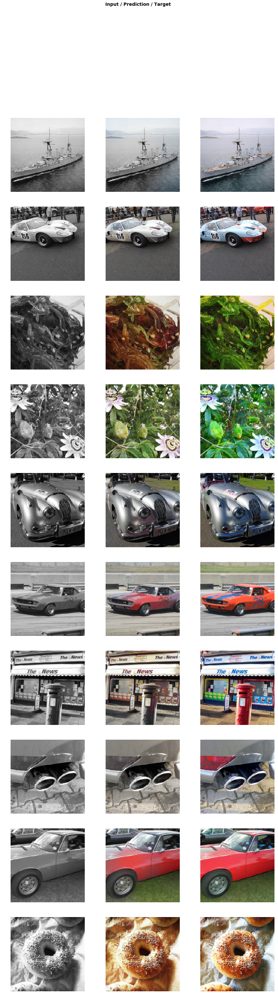

In [32]:
do_fit('2freeze')

In [33]:
learn.unfreeze()

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2
1,1.218732,1.207233,0.214534,0.114873,0.147662,0.073844,0.209404,0.312979,0.133936
2,1.188563,1.206430,0.214188,0.114709,0.147530,0.073812,0.209494,0.312762,0.133934
3,1.188516,1.205691,0.214030,0.114992,0.147656,0.073842,0.208664,0.312612,0.133896
4,1.203808,1.205691,0.214272,0.115190,0.147805,0.073774,0.208252,0.312650,0.133747
5,1.204190,1.203004,0.213029,0.114593,0.147365,0.073668,0.208748,0.311925,0.133676
6,1.189084,1.203094,0.213387,0.114650,0.147399,0.073683,0.208447,0.311845,0.133683
7,1.183320,1.201786,0.212848,0.114670,0.147334,0.073619,0.208150,0.311637,0.133528
8,1.167765,1.200916,0.212651,0.114893,0.147453,0.073591,0.207490,0.311424,0.133414
9,1.197661,1.200644,0.212534,0.114486,0.147112,0.073508,0.208329,0.311311,0.133365
10,1.176876,1.201804,0.212799,0.114679,0.147327,0.073601,0.208296,0.311640,0.133462


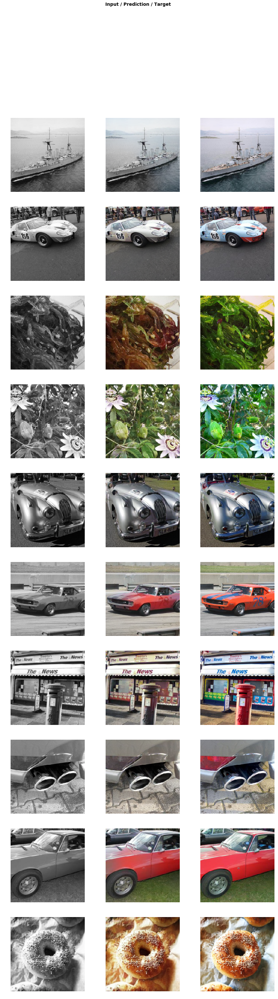

In [34]:
do_fit('2unfreeze', slice(1e-6,1e-4), pct_start=0.3)

In [24]:
learn = None
gc.collect();

In [25]:
learn = unet_learner(data, arch, loss_func=F.l1_loss, blur=True, norm_type=NormType.Weight)

In [26]:
path_new = path/'new'

In [27]:
data_t = (ImageImageList.from_folder(path_new).random_split_by_pct(0.1, seed=42)
          .label_from_func(lambda x: path_new/x.name)
          .transform(get_transforms(), size=(1280,1600), tfm_y=True)
          .databunch(bs=1).normalize(imagenet_stats, do_y=True))
data_t.c = 3

/home/b/anaconda3/envs/fastai_v1/lib/python3.6/site-packages/fastai/data_block.py:401: UserWarning: Your validation set is empty. Is this is by design, use `no_split()` 
                 or pass `ignore_empty=True` when labelling to remove this warning.
  or pass `ignore_empty=True` when labelling to remove this warning.""")


In [28]:
learn.load('3unfreeze')

Learner(data=ImageDataBunch;

Train: LabelList
y: ImageItemList (112893 items)
[Image (3, 279, 512), Image (3, 340, 512), Image (3, 384, 512), Image (3, 512, 512), Image (3, 512, 340)]...
Path: data/gen
x: ImageImageList (112893 items)
[Image (3, 279, 512), Image (3, 340, 512), Image (3, 384, 512), Image (3, 512, 512), Image (3, 512, 340)]...
Path: data/gen;

Valid: LabelList
y: ImageItemList (12543 items)
[Image (3, 392, 512), Image (3, 333, 512), Image (3, 512, 512), Image (3, 287, 512), Image (3, 384, 512)]...
Path: data/gen
x: ImageImageList (12543 items)
[Image (3, 392, 512), Image (3, 333, 512), Image (3, 512, 512), Image (3, 287, 512), Image (3, 384, 512)]...
Path: data/gen;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
      (3): MaxPool2d(kernel_

In [29]:
learn.data = data_t

In [17]:
fn = data_t.train_ds.x.items[0]; fn

PosixPath('data/new/dog.jpeg')

In [18]:
img = open_image(fn); img.shape

torch.Size([3, 183, 275])

In [19]:
p,img_color,b = learn.predict(img)

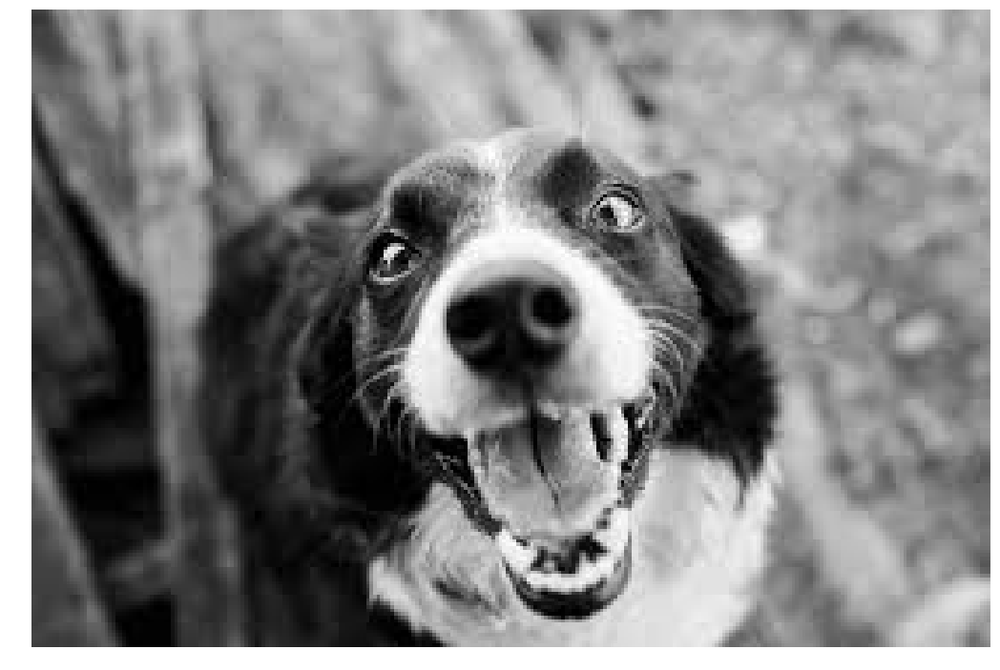

In [20]:
show_image(img, figsize=(18,15), interpolation='nearest');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


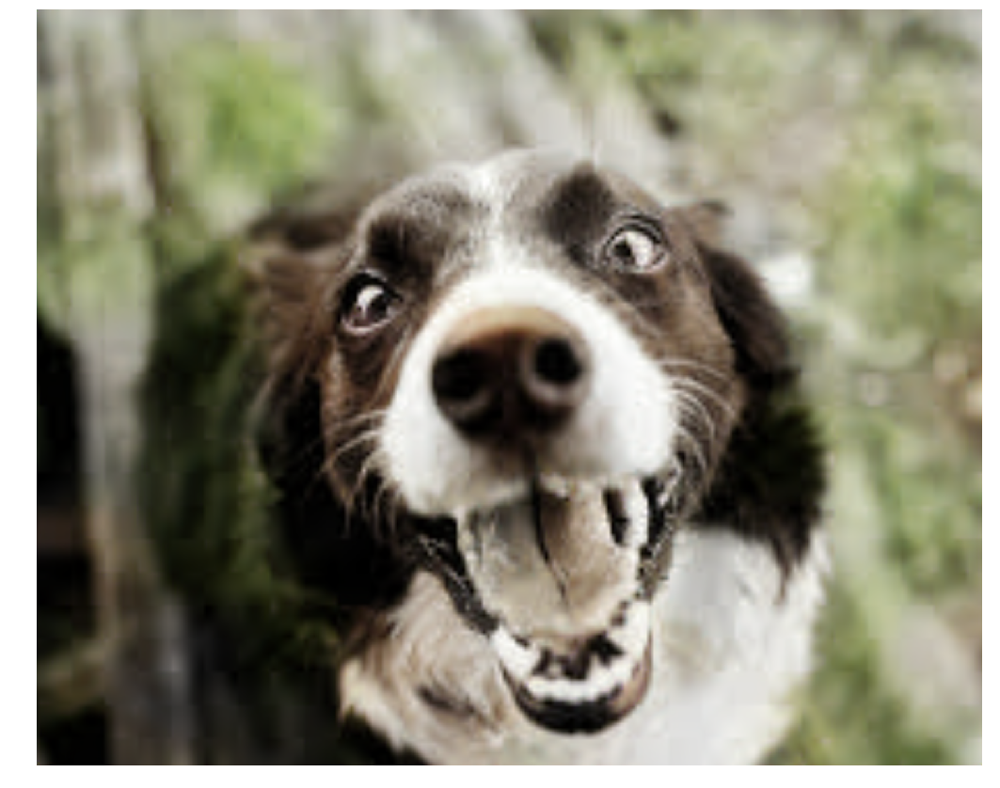

In [21]:
show_image(img_color, figsize=(18,15), interpolation='nearest');

In [22]:
fn = data_t.train_ds.x.items[2]; fn

PosixPath('data/new/abbas-magnum-par63.jpg')

In [23]:
img = open_image(fn); img.shape

torch.Size([3, 681, 968])

In [34]:
p,img_color,b = learn.predict(img)

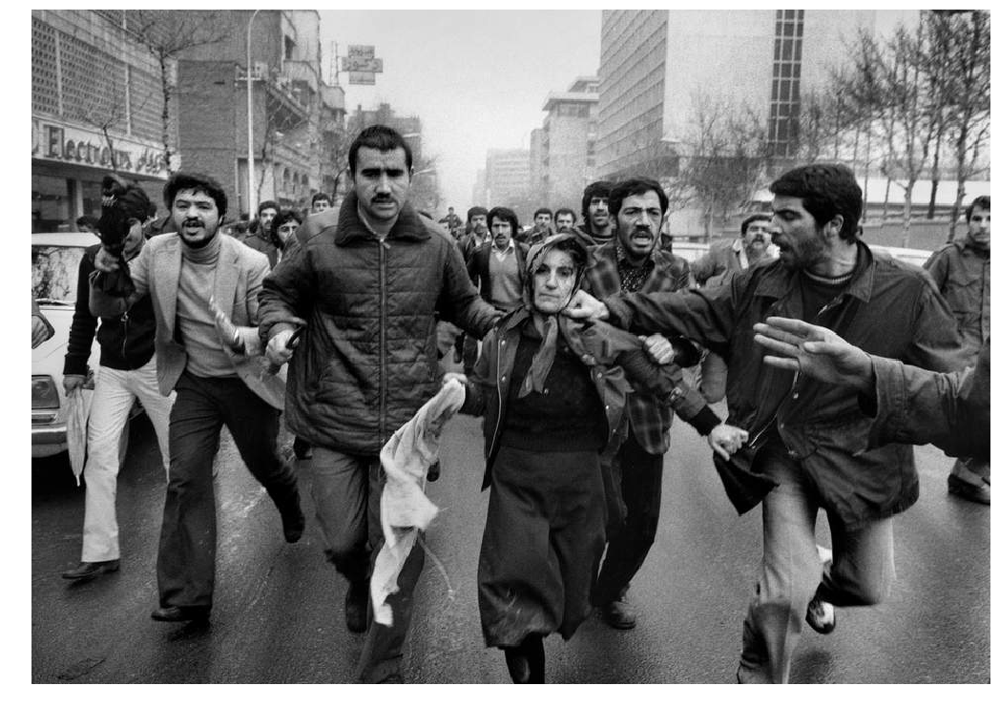

In [25]:
show_image(img, figsize=(18,15), interpolation='nearest');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


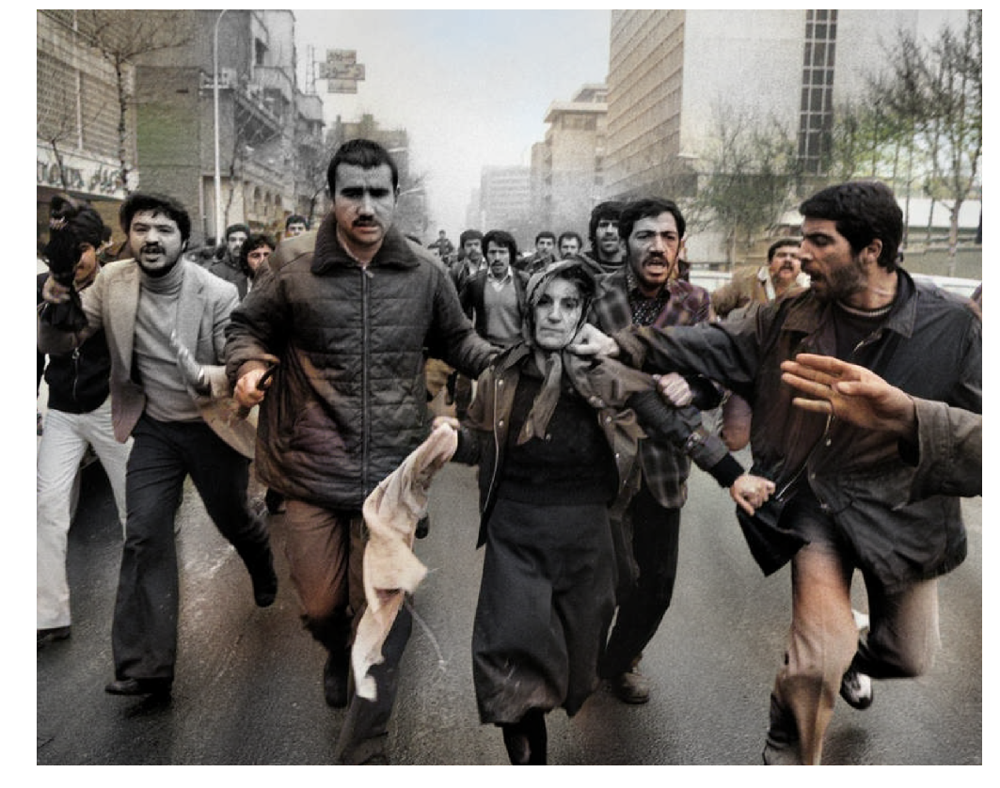

In [26]:
show_image(img_color, figsize=(18,15), interpolation='nearest');

In [30]:
fn = data_t.train_ds.x.items[1]; fn

PosixPath('data/new/images.jpeg')

In [31]:
img = open_image(fn); img.shape

torch.Size([3, 183, 275])

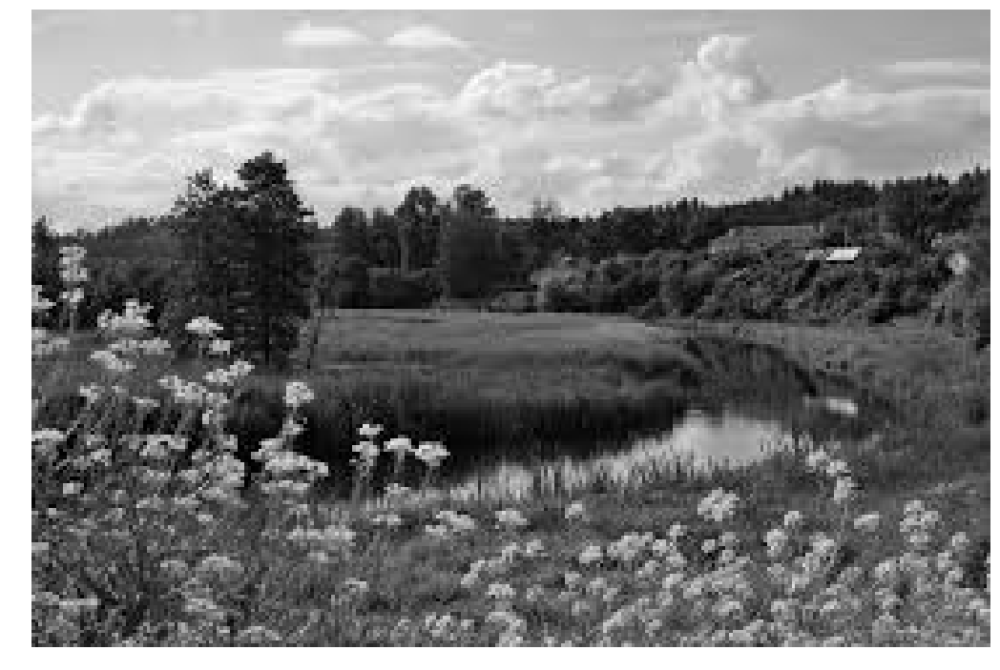

In [32]:
show_image(img, figsize=(18,15), interpolation='nearest');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


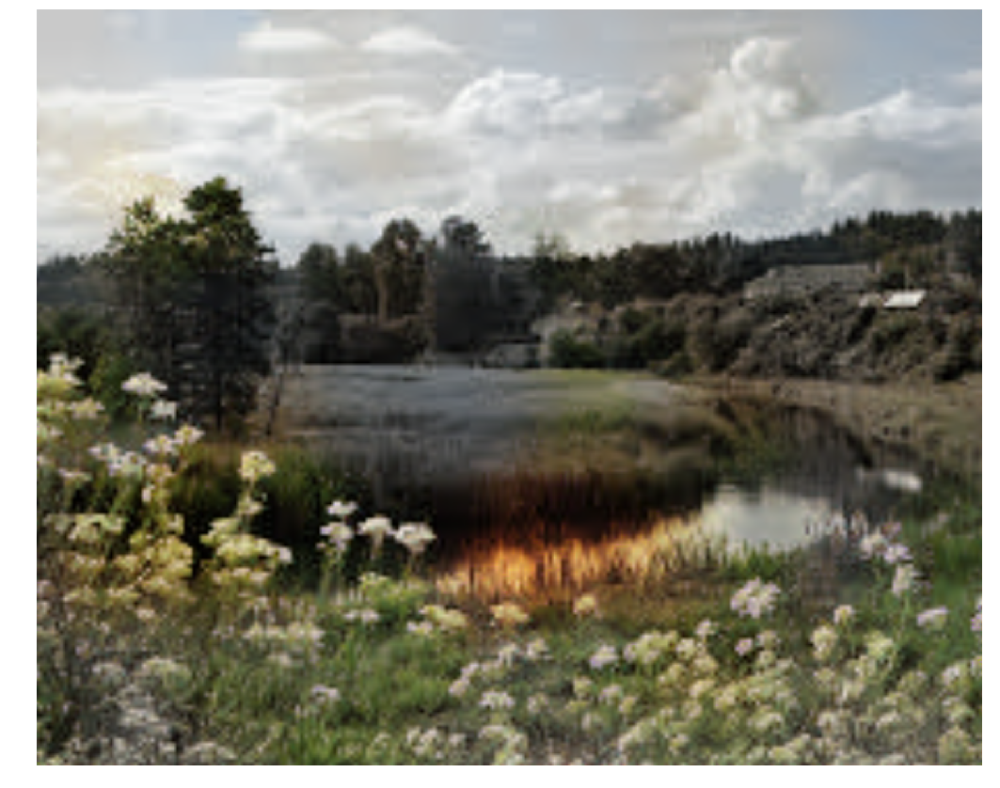

In [35]:
show_image(img_color, figsize=(18,15), interpolation='nearest');